# Predicting Airbnb Listing Prices with Listing Characteristics
### STAT 301 - Final Project
By: Joyce Cao, Matthew Tam, Zaim Naqvi, Genevieve Hoang

# Introduction

Short-term rental platforms such as Airbnb have transformed the hospitality industry by offering travelers a wide range of accommodation options beyond traditional hotels.  As the market continues to grow, accurate pricing listings become increasingly important for both hosts seeking to optimize revenue and guests aiming to find fair value. Previous research has identified various determinants of Airbnb pricing, ranging from different property attributes to host characteristics. 

Wang and Nicolau (2017) conducted an analysis of Airbnb listings across 33 cities and found that listing features such as room type, number of guests accommodated, location, and amenities significantly impacted pricing. Their study highlights the use of hedonic pricing models in capturing the contribution of each feature to the overall price, which offers a framework for predictive modelling in the context of our project. Similarly, Gibbs et al. (2018) applied a hedonic pricing model to Airbnb data and showed that host characteristics like response rate and number of reviews also play a meaningful role in shaping value and pricing. 

Beyond structural attributes, social and psychological elements also influence listing prices, as demonstrated by Ert, Fleischer, and Magen (2016). They showed that trust-related cues, like host profile photos, can impact perceived trustworthiness, booking behaviour, and pricing. Their findings reflect the broader role of host reputation in the economy, where personal presentation and reputation often substitute for formal guarantees. 

Our project builds upon this body of literature by developing a predictive model to estimate the total price of an Airbnb listing in Europe based on various listing characteristics, including room type, number of guests, location features, and host attributes. By exploring these factors through exploratory data analysis and statistical modeling, we aim to understand which variables are most influential in determining price and provide insights that can inform both users and future research in the domain of the sharing economy.

### Data Description

**Source:** https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities

There are 6 datasets in total, containing data about Airbnb listings in Barcelona, Paris, and Vienna, on the weekdays and weekends.

The data has been combined, and the columns `city` and `day_type` were created.

The combined dataset contains 13,058 rows of data about Airbnb listings in Barcelona, Paris, and Vienna.

The combined dataset contains 21 columns as shown below:

**Table 1**


| Variable Name              | Description                                                                 | Variable Type      |
|---------------------------|-----------------------------------------------------------------------------|-----------|
| realSum                   | Total price in EUR for a 2-night stay for 2 guests                         | Continuous   |
| room_type                 | Type of room listed (Entire home/apt, Private room, Shared room)     | Categorical  |
| room_shared               | TRUE if the room is shared                                                  | Logical   |
| room_private              | TRUE if the room is private                                                 | Logical   |
| person_capacity           | Maximum number of guests allowed                                           | Numeric (Discrete)   |
| host_is_superhost         | TRUE if the host is a superhost                                             | Logical   |
| multi                     | Indicator for hosts with 2–4 listings                                       | Numeric (Binary) |
| biz                       | Indicator for hosts with >4 listings (business hosts)                       | Numeric (Binary) |
| cleanliness_rating        | Cleanliness rating (0–10 scale)                                             | Numeric (Discrete)   |
| guest_satisfaction_overall| Overall guest satisfaction rating (0–100 scale)                             | Numeric (Discrete)   |
| bedrooms                  | Number of bedrooms (0 = studio)                                             |  Numeric (Discrete)   |
| dist                      | Distance to city center in kilometers                                       | Continuous   |
| metro_dist                | Distance to nearest metro station in kilometers                             | Continuous   |
| attr_index                | Attraction index based on location                                          | Continuous   |
| attr_index_norm           | Normalized attraction index (0–100)                                         | Continuous   |
| rest_index                | Restaurant index based on location                                          | Continuous   |
| rest_index_norm           | Normalized restaurant index (0–100)                                         | Continuous   |
| lng                       | Longitude of the listing                                                    | Continuous   |
| lat                       | Latitude of the listing                                                     | Continuous   |
| city                      | City name                                                                   | Categorical |
| day_type                  | Type of day (Weekday, Weekend)                                        | Categorical |


**Question:**

Using this dataset, we would like to answer the question:
>Which set of predictors, methods, and coefficients best predict affordable Airbnb listing prices in Paris, Barcelona, and Vienna based on various characteristics of the Airbnb

>*For the purpose of this study, affordable is defined as Airbnb prices lower than the 99th percentile (1180 euros)*

We are interested in understanding how the combination of different listing characteristics and location-related factors can predict Airbnb pricing of future listings. Specifically, we will explore the physical characteristics of each Airbnb (e.g. room type, how many people it accommodates, the cleanliness rating, etc.) and the external factors (e.g. distance from metro or city center, the city it is in, the day of the week, etc.)

Thus, we define `realSum` as the response variable, and consider all other variables that show a significant relationship with it as explanatory variables.

--------


# Method and Results

In [33]:
# Load Packages
library(tidyverse)
library(broom)
library(leaps)
library(MASS)
library(rsample)
library(dplyr)
library(readr)
library(corrplot)
library(ggplot2)
library(car)
library(glmnet)

set.seed(999)

In [34]:
# Load Data 
#airbnb <- read_csv('airbnb.csv')

airbnb <- read_csv('airbnb.csv')
head(airbnb)

Rows: 13058 Columns: 21
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (3): room_type, city, day_type
dbl (15): realSum, person_capacity, multi, biz, cleanliness_rating, guest_sa...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,FALSE,FALSE,4,FALSE,0,1,10,91,⋯,1.111996,0.63049095,526.4694,17.94293,915.5871,20.15489,2.17556,41.39624,Barcelona,Weekday
169.8978,Private room,FALSE,TRUE,2,TRUE,1,0,10,88,⋯,1.751839,0.12401717,320.1275,10.91046,794.2774,17.48449,2.14906,41.38714,Barcelona,Weekday
161.9848,Private room,FALSE,TRUE,4,FALSE,0,1,9,88,⋯,1.670493,0.08032198,344.0739,11.72659,840.6736,18.50581,2.15357,41.37859,Barcelona,Weekday
367.9568,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,10,91,⋯,1.475847,0.09310686,400.0574,13.63460,946.5899,20.83736,2.16839,41.37390,Barcelona,Weekday
196.8953,Private room,FALSE,TRUE,3,FALSE,1,0,9,91,⋯,1.855452,0.27248605,346.0422,11.79368,792.2960,17.44087,2.15238,41.37699,Barcelona,Weekday
330.9517,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,9,100,⋯,2.565611,0.70129045,391.0874,13.32889,525.5139,11.56818,2.18197,41.40842,Barcelona,Weekday


**a.) Exploratory Data Analysis (EDA)**

In [35]:
# Main developer: Joyce 
#Check for na values in the data
sum(is.na(airbnb))

[1] 0

In [36]:
# Main developer: Joyce
quantile(airbnb$realSum, 0.99, na.rm = TRUE)

99% 
1180.185

In [37]:
# Main developer: Joyce
# Handle potential outliers in price (remove extreme values)
airbnb <- filter(airbnb, realSum > 0 & realSum < quantile(realSum, 0.99, na.rm = TRUE))
head(airbnb)

realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,FALSE,FALSE,4,FALSE,0,1,10,91,⋯,1.111996,0.63049095,526.4694,17.94293,915.5871,20.15489,2.17556,41.39624,Barcelona,Weekday
169.8978,Private room,FALSE,TRUE,2,TRUE,1,0,10,88,⋯,1.751839,0.12401717,320.1275,10.91046,794.2774,17.48449,2.14906,41.38714,Barcelona,Weekday
161.9848,Private room,FALSE,TRUE,4,FALSE,0,1,9,88,⋯,1.670493,0.08032198,344.0739,11.72659,840.6736,18.50581,2.15357,41.37859,Barcelona,Weekday
367.9568,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,10,91,⋯,1.475847,0.09310686,400.0574,13.63460,946.5899,20.83736,2.16839,41.37390,Barcelona,Weekday
196.8953,Private room,FALSE,TRUE,3,FALSE,1,0,9,91,⋯,1.855452,0.27248605,346.0422,11.79368,792.2960,17.44087,2.15238,41.37699,Barcelona,Weekday
330.9517,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,9,100,⋯,2.565611,0.70129045,391.0874,13.32889,525.5139,11.56818,2.18197,41.40842,Barcelona,Weekday


Since our research question focuses on predicting *affordable* Airbnb prices, to ensure that we better capture the characteristics and pricing patterns of listings that are more accessible to the average traveler, we removed Airbnb listings with prices above the 99th percentile of this dataset (1180 euros). These extreme values, while valid, represent luxury or atypical accommodations that are not reflective of the general market for affordable Airbnb listings. Including them would have disproportionately affected our model and skewed the results. 

In [38]:
# Main developer: Zaim

library(e1071)

airbnb %>%
  summarise(
    mean = mean(realSum),
    median = median(realSum),
    sd = sd(realSum),
    min = min(realSum),
    max = max(realSum),
    skewness = skewness(realSum),
    kurtosis = kurtosis(realSum))

mean,median,sd,min,max,skewness,kurtosis
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
310.1689,258.2802,178.0618,63.57665,1178.581,1.692974,3.358623


***Table 3 showing statistics of price of Airbnbs***

**Understanding the response:** The average price of an Airbnb listing is 310.1689 euros however the median is lower at 258.28 euros, indicating a right-skewed distribution with many high-price listings (outliers) pulling up the mean as supported by a fat-tail measure given by a kurtosis of 3.36.


**Correlation With Price:**

To explore the relationships between the continuous variables and price, we can plot a correlation heatmap. This helps us to quickly identify which numeric variables are associated with price, to what degree, and identify variables that might have less explanatory power. It also helps us spot potential multicollinearity issues.

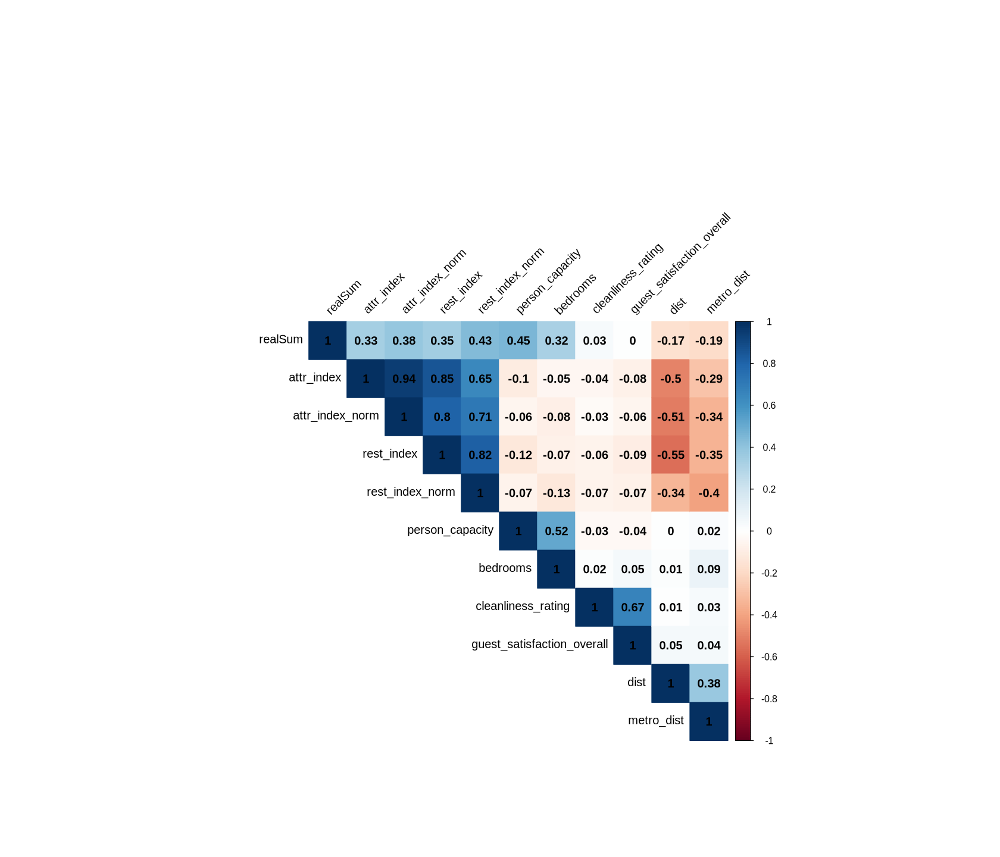

In [39]:
# Main developer: Joyce 
# Contributor: Matthew (Interpretation), Zaim (Interpretation)

selected_cols <- c("realSum", "person_capacity", "bedrooms", "cleanliness_rating", 
                   "guest_satisfaction_overall", "dist", "metro_dist", "attr_index", "rest_index",
                   "attr_index_norm", "rest_index_norm")

correlation_data <- airbnb[, selected_cols]

cor_matrix <- cor(correlation_data)

corrplot(cor_matrix, 
         method = "color",   
         type = "upper",    
         order = "hclust",          
         tl.cex = 1,           
         tl.col = "black",    
         tl.srt = 45,              
         addCoef.col = "black",    
         number.cex = 01)
options(repr.plot.width = 14, repr.plot.height = 12)



From the plot, we can note that `person_capacity`, `rest_index_norm`, and `attr_index_norm` show the highest absolute correlations with `realSum`, at $0.45$, $0.43$, and $0.38$ respectively. Note the strong associations between `attr_index` and `attr_index_norm`, and between `rest_index` and `rest_index_norm`. This is expected, as the latter variables are normalized versions of the former.  Finally, note that the variable `dist` shows a moderate negative association with the attraction and rest index variables.

Next, we will explore the relationships between the response and the categorical variables.  We can use boxplots to show visual comparison of the distributions of the response at each factor level, including the median, spread, and outliers.  This can help determine which categorical variables are likely to be significant predictors and reveal patterns of factor-level differences in price.

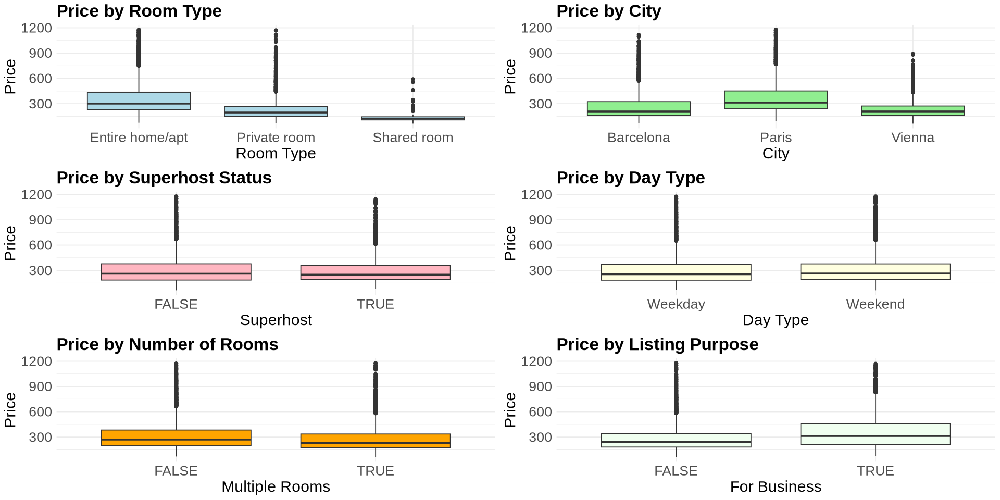

In [40]:
# Main developer: Joyce 
# Contributor: Matthew (Interpretation, Debugging), Zaim (Interpretation)

# Price vs Room Type
p1 <- ggplot(airbnb, aes(x = room_type, y = realSum)) + geom_boxplot(fill = "lightblue") + labs(title = "Price by Room Type", x = "Room Type", y = "Price") + 
 theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
    axis.text = element_text(size = 16))


# Price vs City
p2 <- ggplot(airbnb, aes(x = city, y = realSum)) + geom_boxplot(fill = "lightgreen") + labs(title = "Price by City", x = "City", y = "Price") +
theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
    axis.text = element_text(size = 16))

# Price vs Superhost
p3 <- ggplot(airbnb, aes(x = factor(host_is_superhost), y = realSum)) + geom_boxplot(fill = "lightpink") + labs(title = "Price by Superhost Status", x = "Superhost", y = "Price") +
theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
    axis.text = element_text(size = 16))

# Price vs Day Type
p4 <- ggplot(airbnb, aes(x = day_type, y = realSum)) +geom_boxplot(fill = "lightyellow") + labs(title = "Price by Day Type", x = "Day Type", y = "Price")+
theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
axis.text = element_text(size = 16))

# Price vs Number of Rooms
p5 <- ggplot(airbnb, aes(x = factor(multi), y = realSum)) +geom_boxplot(fill = "orange") +
labs(title = "Price by Number of Rooms", x = "Multiple Rooms", y = "Price") + scale_x_discrete(labels = c("0" = "FALSE", "1" = "TRUE")) +
theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
axis.text = element_text(size = 16))

# Price vs Purpose 
p6 <- ggplot(airbnb, aes(x = factor(biz), y = realSum)) + geom_boxplot(fill = "honeydew") +    labs(title = "Price by Listing Purpose", x = "For Business", y = "Price") +
    scale_x_discrete(labels = c("0" = "FALSE", "1" = "TRUE")) + theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + 
theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
    axis.text = element_text(size = 16))


library(gridExtra)
options(repr.plot.width = 16, repr.plot.height = 8)
grid.arrange(p1, p2, p3, p4, p5, p6, ncol = 2)


From these boxplots, we observe that `room_type` and `city` show differences in price between their factor levels.  For `room_type`, we can see that entire home/apartment listings have the highest median price, followed by private, then shared rooms.  For `city`, we can see that Paris has the highest median price, followed by Vienna, then Barcelona.  We can also see that business listings (`biz`) tend to have higher prices, and listings for multiple rooms (`multi`) tend to have slightly lower prices.  These patterns suggest that these variables could potentially be significant predictors of price.

The remaining variables do not show notable patterns, suggesting that they may not have a significant impact on price.  We should also consider that their effects could be confounded by other variables.

We removed the following variables from our dataset based on domain knowledge and statistical justification:
- `room_shared` and `room_private`: Information is already captured by the room_type variable, which is more comprehensive.
- `attr_index` and `rest_index`: Redundant, contribute to multicollinearity with their normalized versions (attr_index_norm, rest_index_norm), which we retained.
- `lng` and `lat`: Location information is already summarized by the city variable.

In [41]:
# Main developer: Matthew
# Select Relevant Variables
airbnb_clean <- airbnb %>%
    dplyr::select( -room_shared, -room_private, -attr_index, -rest_index, -lng, -lat)
head(airbnb_clean)

realSum,room_type,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index_norm,rest_index_norm,city,day_type
<dbl>,<chr>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,4,FALSE,0,1,10,91,1,1.111996,0.63049095,17.94293,20.15489,Barcelona,Weekday
169.8978,Private room,2,TRUE,1,0,10,88,1,1.751839,0.12401717,10.91046,17.48449,Barcelona,Weekday
161.9848,Private room,4,FALSE,0,1,9,88,1,1.670493,0.08032198,11.72659,18.50581,Barcelona,Weekday
367.9568,Entire home/apt,3,FALSE,0,1,10,91,1,1.475847,0.09310686,13.63460,20.83736,Barcelona,Weekday
196.8953,Private room,3,FALSE,1,0,9,91,1,1.855452,0.27248605,11.79368,17.44087,Barcelona,Weekday
330.9517,Entire home/apt,3,FALSE,0,1,9,100,2,2.565611,0.70129045,13.32889,11.56818,Barcelona,Weekday


**b.) Analysis Plan**

To answer our question in predicting price using the variables will be performed within a multiple linear regression framework (additive). This approach is appropriate because our response variable, price (in Euros), is continuous, not binary or a count, which might require logistic or Poisson regression and because price has a moderate positive correlation with bedrooms, person_capacity, rest_index_norm, and attr_index_norm and even a weakly negative correlation giving some credence to the linearity assumption. 

1. **Data Splitting**: We will begin by splitting the splitting the dataset into a training set (75%) and a testing set (25%) using `initial_split()` from the rsample package. All variable selection and model fitting will be conducted exclusively on the training set to avoid data leakage, double dipping and ensure an unbiased estimate of the model's performance
2. **Variable Selection**: To identify the most relevant predictors of Airbnb listing prices, we will apply LASSO regression via `cv.glmnet` which applies an L1-norm penalty (using $\lambda$ on the sum of absolute values of coefficients) to shrink less important coefficients to zero. This approach is more robust than traditional stepwise selection, and helps prevent overfitting. The optimal value of the regularization parameter $\lambda$ was chosen using cross-validation by splitting the training data in 10 folds with each fold (randomizing 9 parts training sets and 1 part validation set) plotting the same sequence of λ values giving 10 cross-validation errors for each λ. After which the λ with the lowest average prediction error (MSE) is chosen ensuring that the chosen model generalizes well to new data by minimizing prediction error on unseen subsets of training data. Note since this model is based on prediction and we are less concerned about interpretation, it's unnecessary to decrease coefficients to zero by increasing λ for less complexity.
3. **Model Evaluation**: Once the final model is selected, we will evaluate its predictive performance using the testing set. Since our response variable `realSum` is continuous, we will use the RMSE to measure the average magnitude of the prediction errors and the R-squared metric to quantify the proportion of variance in listing prices that is explinated by the model on unseen data. We will use the `predict()` function to generate predictions on the test data.
4. **Model Diagnostic Checks**: Before finalizing the model, we will perform a series of diagnostic checks to ensure key assumptions of linear regression are not violated, including:
   - Assessing linearity and homoscedasticity using residual plots
   - Evalute normality of residuals using QQ-plots
   - Check multicolinearity among predictors using `vif()`

**c.) Results**

**Data Splitting**

In [42]:
# Main developer: Matthew
# Train/Test Split
split_data <- initial_split(airbnb_clean, prop = 0.75)

train <- training(split_data)
test <- testing(split_data)

**Variable Selection**

In [43]:
# Main developer: Joyce

# Lasso Regression
lasso_model <- cv.glmnet(model.matrix(realSum ~ . - 1, data = train),
                         y = train$realSum,
                         alpha = 1
    
)
lasso_model


Call:  cv.glmnet(x = model.matrix(realSum ~ . - 1, data = train), y = train$realSum,      alpha = 1) 

Measure: Mean-Squared Error 

    Lambda Index Measure    SE Nonzero
min  0.209    65   15303 438.0      16
1se  5.962    29   15696 474.3      11

In [44]:
# Main developer: Joyce

# Chosen Lasso Coefficients
beta_lasso <- coef(lasso_model, s = "lambda.min")


lasso_selected_covariates <- as_tibble(
        as.matrix(beta_lasso),
        rownames='covariate') %>%
        filter(covariate != '(Intercept)' & abs(s1) !=0) %>% 
        pull(covariate)

cat(paste0("- ", lasso_selected_covariates), sep = "\n")

- room_typeEntire home/apt
- room_typeShared room
- person_capacity
- host_is_superhostTRUE
- multi
- biz
- cleanliness_rating
- guest_satisfaction_overall
- bedrooms
- dist
- metro_dist
- attr_index_norm
- rest_index_norm
- cityParis
- cityVienna
- day_typeWeekend


In [45]:
# Main developer: Joyce

# To keep the reference levels of dummy variables consistent through lasso and lm
train$room_type <- relevel(factor(train$room_type), ref = "Private room")

# Selected linear model
airbnb_mlr_predictor <- lm(realSum ~ ., data = train)

tidy(airbnb_mlr_predictor)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-223.3467499,16.4268881,-13.5964127,1.015078e-41
room_typeEntire home/apt,79.9161031,3.4695311,23.0336895,2.452909e-114
room_typeShared room,-152.2948173,13.3903368,-11.3734867,8.756841e-30
person_capacity,41.8367785,1.4047762,29.7818109,1.470004e-186
host_is_superhostTRUE,12.1717250,3.3776281,3.6036309,3.153778e-04
multi,19.9455658,3.2092606,6.2150034,5.343992e-10
biz,62.0525202,3.2371119,19.1690997,2.051274e-80
cleanliness_rating,10.8457334,1.7869872,6.0692844,1.333031e-09
guest_satisfaction_overall,0.5868656,0.2068340,2.8373745,4.558079e-03


**Model Evaluation**

In [46]:
# Main Developer: Joyce

evaluate_model <- function(observed, predicted) {
  residuals <- observed - predicted
  
  metrics <- list(
    RMSE = sqrt(mean(residuals^2)),
      MSE = mean(residuals^2),
    MAE = mean(abs(residuals)),
    R_squared = 1 - sum(residuals^2) / sum((observed - mean(observed))^2)
  )
  
  return(metrics)
}

# Compute RMSE
test_predictions <- predict(airbnb_mlr_predictor, newdata = test)

model_performance <- evaluate_model(test$realSum, test_predictions)

model_performance

$RMSE
[1] 119.5124

$MSE
[1] 14283.2

$MAE
[1] 85.77273

$R_squared
[1] 0.5419883

The model achieved a test RMSE of approximately 119.51, a test MAE of 85.77, and a test R-squared of 0.542. 

- The test RMSE of 119.51 (MSE of 14283.2) indicates that, on average, the model's predicted listing prices differ from the actual prices by about 119 euros, with larger errors being penalized more heavily due to the squaring of residuals.
- The MAE of 85.77 provides a more straighforward measure, indicating that, on average, the model's predictions are off by about 86 euros. We believe this is within a reasonable range given the variability in Airbnb prices.
- The R-squared value of 0.542 indicates that about 54.2% of the variation in Airbnb listing prices in the test set is explained by our model, suggesting that a meaningful portion of the data is captured by the model, though there is still room for improvement.

Overall, our model shows moderate predictive accuracy, and could be potentially further improved (discussed further in the dicussion)

**Model Diagnostic Check**

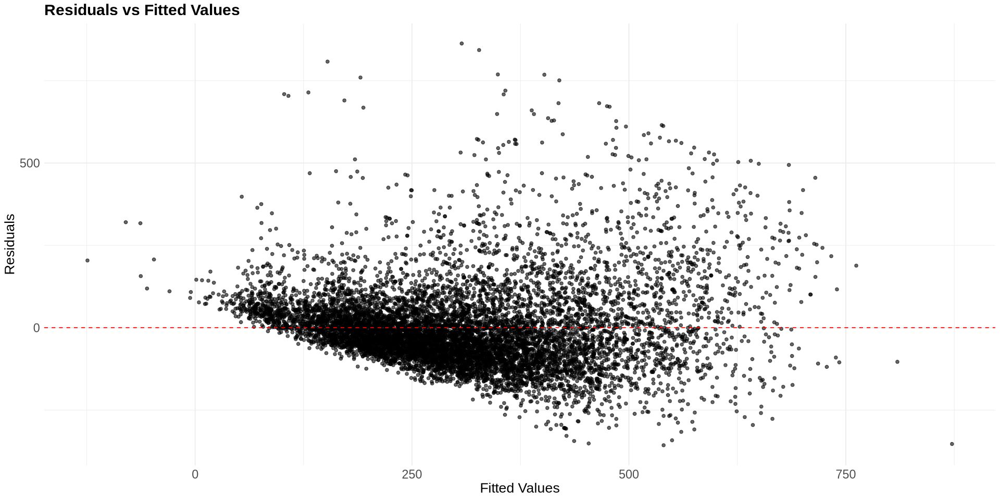

In [47]:
# Main Developer: Joyce
# Contributor: Zaim (Interpretation)
# Residuals vs Fitted Values
diagnostics <- augment(airbnb_mlr_predictor)

ggplot(diagnostics, aes(.fitted, .resid)) +
  geom_point(alpha = 0.6) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(title = "Residuals vs Fitted Values",
       x = "Fitted Values",
       y = "Residuals") +
  theme_minimal() +   theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14)
  )

The residuals vs fitted values plot shows that the residuals are generally centered around zero, however, there is a clear funnel-shaped pattern (spread of residuals increase with fitted values). This indicates a violation of the constant variance (homoscedasticity) assumption. Thus, this model tends to be more variable and less accurate for higher-priced listings. This could potentially be addressed in future work by transforming the response variable (e.g. log transformation).

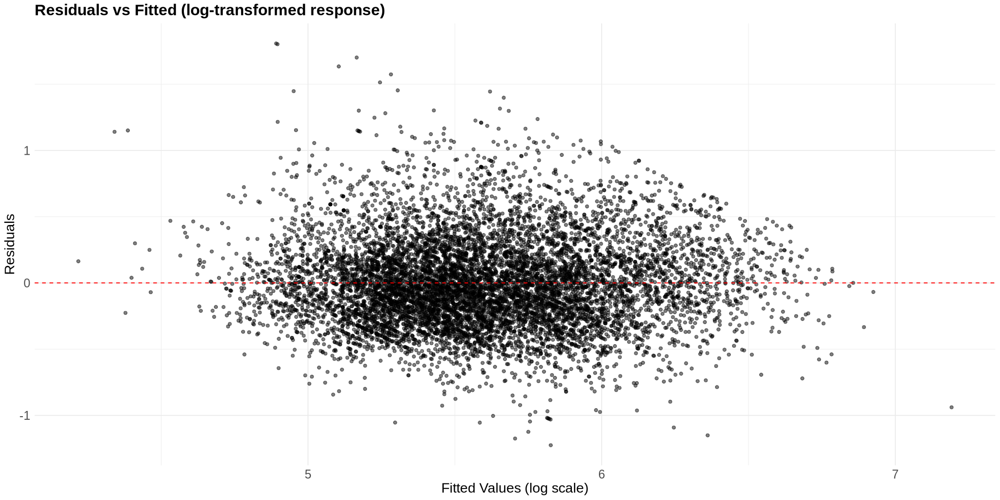

In [48]:
# Main developer: Joyce
# Contributor: Zaim (Interpretation)

airbnb_log_model <- lm(
  log(realSum) ~ room_type + person_capacity + cleanliness_rating + bedrooms + dist +metro_dist + attr_index_norm + rest_index_norm +    city + day_type, data = train)

diagnostics_log <- augment(airbnb_log_model)

# Plot Residuals vs Fitted
library(ggplot2)
ggplot(diagnostics_log, aes(.fitted, .resid)) +
  geom_point(alpha = 0.5) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(title = "Residuals vs Fitted (log-transformed response)",
       x = "Fitted Values (log scale)",
       y = "Residuals") +
  theme_minimal() +   theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14)
  )

The log transformation of the response variable improved the model assumptions and addressed the heteroscedasticity issue. However, transforming the response changes the interpretation of the model and can introduce bias when exponentiating the predictions to the original scale. To maintain interpretability and direct prediction of the response, we will choose to continue with the original model for prediction. Future studies focusing on improving model validity could address this violation through transformations (log or square root) or other modeling techniques.

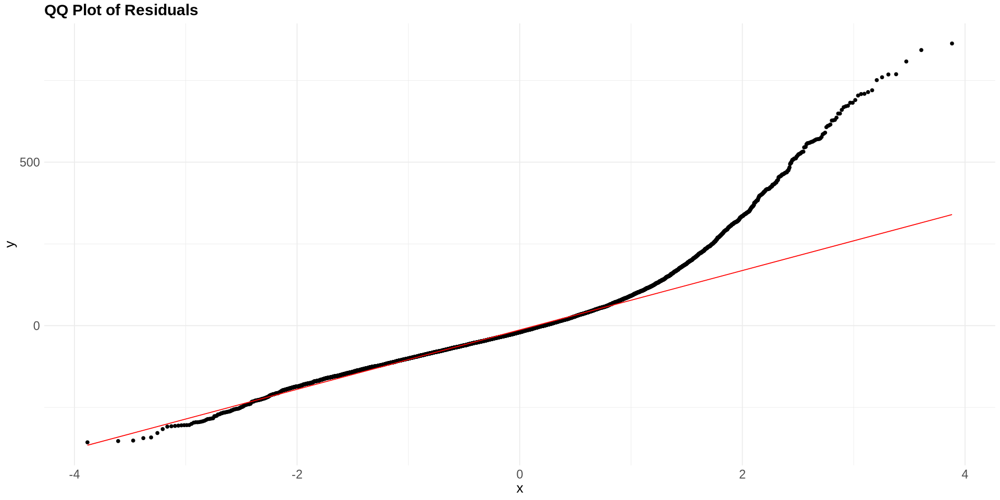

In [49]:
# Main Developer: Joyce
# Contributor: Zaim (Interpretation)
# QQ plot

ggplot(diagnostics, aes(sample = .resid)) +
  stat_qq() +
  stat_qq_line(color = "red") +
  labs(title = "QQ Plot of Residuals") +
  theme_minimal()  +   theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14)
  )

There seems to be some right skewness in the residuals as suggested earlier as well by table 3, however, since our sample size is large, we can proceed with the current model while acknowledging that prediction intervals may be less accurate due to the heavy tails. The point estimates and overall model performance should remain reliable.

In [50]:
# Main Developer: Joyce
vif(airbnb_mlr_predictor)

,GVIF,Df,GVIF^(1/(2*Df))
room_type,1.763759,2,1.152417
person_capacity,1.912414,1,1.382901
host_is_superhost,1.104457,1,1.050931
multi,1.288862,1,1.135280
biz,1.376573,1,1.173275
cleanliness_rating,1.851427,1,1.360672
guest_satisfaction_overall,1.933239,1,1.390410
bedrooms,1.532202,1,1.237821
dist,2.218126,1,1.489338
metro_dist,1.522551,1,1.233917


Most predictors had low VIF values (below 5), indicating minimal multicollinearity. Two predictors — `rest_index_norm` and `city` — had moderately high VIFs (both around 8), suggesting some multicollinearity. However, since the goal of this analysis is prediction rather than inference, and the predictive performance was not negatively affected, all variables were retained in the final model.

---

### Discussion

Our analysis sought to build a predictive model for Airbnb listing prices across Barcelona, Paris, and Vienna using LASSO regression. With a test set RMSE of approximately 119.51, an MAE of 85.77, and an R² of 0.542, the final model demonstrates moderate predictive accuracy (as explained earlier), suggesting that just over half the variation in Airbnb prices can be explained by the predictors included. While this leaves considerable room for improvement, the results still highlight meaningful patterns in the dataset 

One encouraging outcome was that none of the 14 selected predictors were removed by LASSO, indicating that each contributed some predictive value to the model. This is consistent with the complex nature of Airbnb pricing, which likely depends on a variety of listing characteristics, host attributes, and location-based factors. Note although for prediction, p values are less of a concern, it must be noted that based an alpha of 0.05, all predictors were statistically associated with price except for Paris and distance from a metro station.

The predictor coefficients (**represent changes in expected listing price, measured in euros**) are interpreted as follows, while holding in mind that considering this is an additive model, all other variables but the variable of interest are held constant. In particular, listings categorized as Entire home/apt were associated with significantly higher prices (β ≈ 80), while Shared rooms were associated with drastically lowered prices (β ≈ -152), compared to the baseline (Private room). This aligns with intuitive pricing hierarchies in hospitality. Business hosts (those with more than 4 listings) were associated with much higher charged prices (β ≈ 62) than those with 1 listing, while hosts with 2–4 listings were associated with only slightly higher charged prices relative to those with 1 listing (β ≈ 20), as expected, likely reflecting greater experience or better pricing strategies. Similarly, listings with more bedrooms were associated with an average increase of approximately €64.68 in predicted price, and greater person capacity was also associated with higher pricing (β ≈ 42 per additional guest), reinforcing the expectation that larger listings command more value.

Unsurprisingly, several location-related variables also played a role. Listings in Vienna were significantly cheaper than those in the reference city (Barcelona), with a coefficient of approximately β ≈ -66, while listings in Paris had a small, non-significant increase in price (β ≈ 1.5) relative to Barcelona. The normalized attraction index (β ≈ 3.6) and restaurant index (β ≈ 2.1) were positively associated with price, as expected, suggesting that proximity to amenities influences demand and pricing. Although some multicollinearity was detected (notably between rest_index_norm and city, both with VIFs around 8), it did not noticeably degrade predictive performance.
Weekend listings were priced slightly higher than non-weekend listings, with an average increase of €16.74 (β ≈ 16.7) aligning with the expected bump in leisure-driven demand.

Several additional predictors were significantly associated with price in expected directions. Higher cleanliness rating (β ≈ 10.8) and guest satisfaction overall scores (β ≈ 0.58) were both linked to modest increases in price, reflecting consumer preferences for well-reviewed, high-quality listings. Greater distance to the metrostation by 1 km is associated with decrease in average listing price by 1.17 euros consistent with the importance of location and accessibility. However, unexpectedly the model predicts that a increase in distance from the city centre increases the expected airbnb listing price by 3.31 euros. Superhost status was associated with only a slightly higher charged price (β ≈ 11.3), which is unexpected, as being a Superhost requires high standards to upkeep—including no cancellations, high response rate, etc.—and it is surprising to see only a slight increase in price associated with it.
### NOte dont need two types of distance in model (likely increasing correlation)


While our model had acceptable error rates, the residual diagnostic plots revealed heteroscedasticity and non-normal residuals, likely due to the right-skewed distribution of price. A potential improvement could involve applying a log transformation to the response variable (realSum), which may stabilize variance and yield more normally distributed residuals by shrinking higher prices. Another area for improvement involves interaction terms. Our current model was additive, but it is plausible that interactions exist between variables—for instance, room type and city, or number of bedrooms and host type—which may affect price jointly rather than independently. Exploring two-way interaction terms in future models could help uncover additional structure and enhance predictive performance while not adding more complexity with higher order interaction terms.

Additionally, some omitted variables may explain the remaining unexplained variance. For instance, seasonality and special holidays could capture further price variation (irreducible error in the current model) both of which are known to influence price. Future research could incorporate temporal variables and time series analysis to improve predictions
 
**Future questions**
1. How do seasonal trends and special holidays affect Airbnb listing prices across different cities?
Explanation: As explained earlier, including time-based features like season or local holidays could improve model accuracy by accounting for predictable fluctuations in demand.

2. Can city-specific models outperform a pooled model when predicting Airbnb prices in diverse markets like Barcelona, Paris, and Vienna?
Explanation: Localized models may better capture city-specific regulations, tourist behaviors, and pricing norms that a combined model might overlook.

3. Does including interaction terms between variables like room type and city significantly improve the predictive performance of the model?
Explanation: As explained earlier, the effect of room type may vary by city, and modeling these interactions could reveal important joint effects currently missed.


---

### References

Ert, E., Fleischer, A., & Magen, N. (2016). Trust and reputation in the sharing economy: The role of personal photos in Airbnb. Tourism Management, 55, 62–73. https://doi.org/10.1016/j.tourman.2016.01.013

Gibbs, C., Guttentag, D., Gretzel, U., Morton, J., & Goodwill, A. (2018). Pricing in the sharing economy: A hedonic pricing model applied to Airbnb listings. Journal of Travel & Tourism Marketing, 35(1), 46–56. https://doi.org/10.1080/10548408.2017.1308292

Wang, D., & Nicolau, J. L. (2017). Price determinants of sharing economy-based accommodation rental: A study of listings from 33 cities on Airbnb.com. International Journal of Hospitality Management, 62, 120–131. https://doi.org/10.1016/j.ijhm.2016.12.007

